# Ideal Trajectory

In a simple case, a launched projectile moves along the parabolic trajectory in vacuum.  The only force applied onto the projectile is gravity, which acts downward, thus imparting to the projectile a downward acceleration towards the Earth’s center of mass.

![Ideal Trajectory](img/ideal_trajectory.png)

where:

>  
$x_0$ - initial horizontal position of the projectile.  
$y_0$ - initial vertical position of the projectile.  
$\vec{\upsilon_0}$ - initial velocity vector.  
$\vec{\upsilon_{0_x}}$ - horizontal component of the velocity vector.  
$\vec{\upsilon_{0_y}}$ - vertical component of the velocity vector.  
$h_0$ - initial altitude of the projectile.  
$h_{max}$ - maximum altitude of the projectile.  
$\alpha$ - angle of launch.  
$d_{impact}$ - distance to the impact point (or displacement of the impact point).

Please note, if $x_0 = 0$, then $d_{impact} = x_{impact}$. Also $y_0 = h_0 = d_0$.



## Velocity of the Projectile

The initial velocity of projectile can be expressed as a vector, which is the sum of its horizontal and vertical components:

$$
  \vec{\upsilon_0} = \vec{\upsilon_{0_x}} + \vec{\upsilon_{0_y}}
$$

Initial horizontal and vertical velocities of the projectile can be expressed via trigonometric functions:

$$
  \left.
    \begin{array} {lcl}
      cos(\alpha) = \frac{\upsilon_{0_x}}{\upsilon_0} \\
      sin(\alpha) = \frac{\upsilon_{0_y}}{\upsilon_0}
    \end{array}
  \right\} \Longrightarrow
  \left\{
    \begin{array} {lcl}
      \upsilon_{0_x} = \upsilon_0 cos(\alpha) \\
      \upsilon_{0_y} = \upsilon_0 sin(\alpha)
    \end{array}
  \right.
$$

where:

>  
$\alpha$ - initial launch angle.  
$\upsilon_0$ - initial velocity of the projectile.  
$\upsilon_{0_x}$ - initial horizontal velocity of the object.  
$\upsilon_{0_y}$ - initial vertical velocity of the object.  

A velocity $\upsilon$ at any given point in time depends on initial velocity $\upsilon_0$, acceleration $a$ and time elapsed $t$. According to the _first equation of motion_, integral of acceleration with respect to time is change in velocity $d\upsilon$:

$$
  \begin{array} {lcl}
    a = \frac{d\upsilon}{dt} \\
    d\upsilon = a\ dt \\
    \int{d\upsilon} = \int{a\ dt} \\
    \upsilon - \upsilon_0 = at \\
    \upsilon = \upsilon_0 + at
  \end{array}
$$

The horizontal component of the velocity of the projectile remains unchanged throughout the motion. The vertical component of the velocity changes linearly, because of the acceleration due to gravity $g$, which is constant. 

$$
  \begin{array} {lcl}
    a_x = 0 \\
    a_y = -g
  \end{array}
$$

Hence, components of velocity at any time $t$, can be solved as follows:

$$
  \begin{array} {lcl}
    \upsilon_x(t) = \upsilon_0 cos(\alpha) \\
    \upsilon_y(t) = \upsilon_0 sin(\alpha) - gt
  \end{array}
$$

The magnitude of the velocity under the Pythagorean theorem will be:

$$
  \upsilon(t) = \sqrt{\upsilon_x(t)^2 + \upsilon_y(t)^2}
$$

where:

>  
$t$ - time elapsed since the launch of the projectile.  
$\upsilon(t)$ - velocity of the projectile at any given time $t$.  
$\upsilon_x(t)$ - horizontal velocity of the projectile at any given time $t$.  
$\upsilon_y(t)$ - vertical velocity of the projectile at any given time $t$.  
$g$ - gravitational acceleration near the Earth's surface.  


We can add the function that calculates a velocity of the projectile along the ballistic trajectory at a particular moment in time using equation above.

We can put this function into the class `BallisticTrajectory` for now, and extend this class later.

In [174]:
import math
import numpy as np
import scipy.constants as spc

class BallisticTrajectory:
    
    """
    Class represents a ballistic trajectory.
    """
    
    @staticmethod
    def velocity(v0, t, a = 0):
        
        """
        Calculates the velocity of the projectile along the ballistic 
        trajectory depending on launch parameters and elapsed time.

        Velocity is a function of time and based on the projectile motion 
        equations. It does not consider any external factor excpet initial 
        velocity of the projectile, angle of launch and constant gravitational 
        acceleration.

        Parameters
        ----------

        v0 : float
            The initial velocity of the projectile (m/s).
        t : float
            The time elapsed since launch of the projectile (s).
        a : float (optional)
            The initial angle of launch of the projectile (in degrees) relative 
            to the ground. Angle 0 (default value) means that the projectile was 
            launched parallel to the ground.

        Returns
        -------

        vx : float
            The horizontal component of the projectile velocity (horizontal velocity, m/s).
        vy : float
            The vertical component of the projectile velocity (horizontal velocity, m/s).
        v : float
            The magnitude of the proectile velocity (m/s).
        

        """
        
        rad = math.radians(a)
        vx = v0 * math.cos(rad) + t - t
        vy = v0 * math.sin(rad) - spc.g * t
        
        v = np.sqrt(vx**2 + vy**2)
        return vx, vy, v
    

Now we can check how a velocity of the projectile changes along its ballistic trajectory.

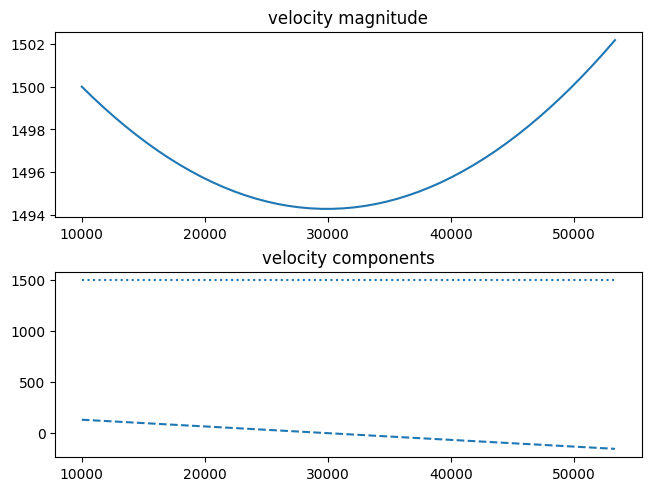

In [32]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

#------------------------------------------------------------------------------
# INPUT PARAMETERS
#------------------------------------------------------------------------------

dt = 30       # time interval 
v0 = 1500     # initial velocity
angle = 5     # angle of launch

#------------------------------------------------------------------------------

t = np.linspace(0, dt - 1)
vx, vy, v = BallisticTrajectory.velocity(v0, t, a=angle)

fig, charts = plt.subplots(2, constrained_layout=True)

# plot the velocity
charts[0].set_title("velocity magnitude")
charts[0].plot(x, v, color="C0")

# plot velocity components
charts[1].set_title("velocity components")
charts[1].plot(x, vx, color="C0", linestyle="dotted")
charts[1].plot(x, vy, color="C0", linestyle="dashed")

On the first figure we can notice that the projectile velocity decreases when approaches the apogee of the ballistic trajectory with the lowest velocity at the apogee. Then it increases again when approaches the ground under the influence of gravity.

On the second figure we can also see that the horizontal velovity (dotted line) remains unchanged while the vertical velocity (dashed line) decreases linearly with `0` at the apogee of the trajectory.

## Displacement of the Projectile

The projectile's displacement can be derived from its velocity. According to the _second equation of motion_, the integral of velocity $\upsilon$ with respect to time $t$ is the displacement of the object $dr$ from its initial position to its final position.

$$
  \begin{array} {lcl}
    \upsilon = \frac{dr}{dt} \\
    dr = \upsilon\ dt = (\upsilon_0 + at)dt \\
    \int{dr} = \int{(\upsilon_0 + at)dt} = \int{\upsilon_0dt} + \int{at\ dt} \\
    r - r_0 = \upsilon_0t + \frac{1}{2}at^2 \\
    r = r_0 + \upsilon_0t + \frac{1}{2}at^2 \\
  \end{array}
$$

We can apply it onto horizontal and vertical velocity of the projectile in order to determine its new horizontal and vertical position. In case of new horizontal position $x$, the horizontal velocity is constant ($\upsilon_{0_x} = \upsilon_x$). The equation will take a form as following:

$$
  \begin{array} {lcl}
    dx = \upsilon_{0_x}\ dt \\
    \int{dx} = \int{\upsilon_{0_x}\ dt} \\
    x - x_0 = \upsilon_{0_x}t \\
    x = x_0 + \upsilon_{0_x}t
  \end{array}
$$

In case of new vertical position $y$, the vertical velocity $\upsilon_y$ is a variable and we applly the second equation of motion as is:

$$
  y = y_0 + \upsilon_{0_y}t + \frac{1}{2}gt^2
$$

If we are interested in the displacement only instead of a new position, then we simply assume that $x_0$ and $y_0$ equal `0`.

$$
  \left.
    \begin{array} {lcl}
      x(t) = \upsilon_{0_x} t \\
      y(t) = \upsilon_{0_y} t - \frac{1}2g t^2 \\
      \upsilon_{0_x} = \upsilon_0\ cos(\alpha) \\
      \upsilon_{0_y} = \upsilon_0\ sin(\alpha)
    \end{array}
  \right\} \Longrightarrow
  \left\{
    \begin{array} {lcl}
      x(t) = \upsilon_0 t\ cos(\alpha) \\
      y(t) = \upsilon_0 t\ sin(\alpha) - \frac{1}{2}gt^2
    \end{array}
  \right.
$$

where:

>  
$x(t)$ - horizontal displacement of the projectile, depending on time.  
$y(t)$ - vertical displacement of the projectile, depending on time.  


Please note, these equations of ballistic trajectory neglects nearly every factor except for initial velocity and constant gravitational acceleration.

The magnitude of the displacement under the Pythagorean theorem will be:

$$
  d(t) = \sqrt{x(t)^2 + y(t)^2}
$$


Let's create functions that calculate the displacement and a new position of the projectile along the ballistic trajectory at a particular moment in time using equations above.

In [1]:
import math
import numpy as np
import scipy.constants as spc

class BallisticTrajectory:
    
    """
    Class represents a ballistic trajectory.
    """
    
    @staticmethod
    def velocity(v0, t, a = 0):
        
        """
        Calculates the velocity of the projectile along the ballistic 
        trajectory depending on launch parameters and elapsed time.

        Velocity is a function of time and based on the projectile motion 
        equations. It does not consider any external factor excpet initial 
        velocity of the projectile, angle of launch and constant gravitational 
        acceleration.

        Parameters
        ----------

        v0 : float
            The initial velocity of the projectile (m/s).
        t : float
            The time elapsed since launch of the projectile (s).
        a : float (optional)
            The initial angle of launch of the projectile (in degrees) 
            relative to the ground. Angle 0 (default value) means that 
            the projectile was launched parallel to the ground.

        Returns
        -------

        vx : float
            The horizontal component of the projectile velocity (horizontal 
            velocity, m/s).
        vy : float
            The vertical component of the projectile velocity (horizontal 
            velocity, m/s).
        v : float
            The magnitude of the proectile velocity (m/s).
        

        """
        
        rad = math.radians(a)
        vx = v0 * math.cos(rad) + t - t
        vy = v0 * math.sin(rad) - spc.g * t
        
        v = np.sqrt(vx**2 + vy**2)
        return vx, vy, v
    
    @staticmethod
    def displacement(v0, t, a = 0):

        """
        Calculates the displacement of the projectile along the ballistic 
        trajectory depending on launch parameters and elapsed time.

        Displacement is a function of time and based on the projectile
        motion equations. It does not consider any external factor excpet 
        initial velocity of the projectile, angle of launch and constant 
        gravitational acceleration.

        Parameters
        ----------

        v0 : float
            The initial velocity of the projectile (m/s).
        t : float
            The time elapsed since launch of the projectile (s).
        a : float (optional)
            The initial angle of launch of the projectile (in degrees) 
            relative to the ground. Angle 0 (default value) means that the 
            projectile was launched parallel to the ground.

        Returns
        -------

        dx : float
            The horizontal displacement (in meters) of the projectile, 
            relative to the initial horizontal position.
        dy : float
            The vertical displacement (in meters) of the projectile, 
            relative to the initial vertical position.
        d : float
            The magnitude of the projectile displacement (in meters).

        """

        rad = math.radians(a)
        v0x = v0 * math.cos(rad)
        v0y = v0 * math.sin(rad)

        dx = v0x * t
        dy = v0y * t - 0.5 * spc.g * t**2
        d = np.sqrt(dx**2 + dy**2)

        return dx, dy, d
    
    @staticmethod
    def position(v0, t, a = 0, x0 = 0, y0 = 0):

        """
        Calculates the new position of the projectile along the ballistic 
        trajectory depending on launch parameters and elapsed time.

        Position is a function of time and based on the projectile
        motion equations. It does not consider any external factor excpet 
        initial velocity of the projectile, initial horizontal position of 
        the projectile, initial vertical position of the projectile (altitude), 
        angle of launch and constant gravitational acceleration.

        Parameters
        ----------

        v0 : float
            The initial velocity of the projectile (m/s).
        t : float
            The time elapsed since launch of the projectile (s).
        a : float (optional)
            The initial angle of launch of the projectile (in degrees) relative 
            to the ground. Angle 0 (default value) means that the projectile was 
            launched parallel to the ground.
        x0 : float (optional)
            The initial horizontal position (in meters) at which the projectile 
            was launched. If the value is `0`, then the new horizontal position 
            equals the horizontal displacement of the projectile.
        y0 : float (optional)
            The initial vertical position (altitude, in meters) at which the 
            projectile was launched. If the value is `0`, then the new vertical 
            position equals the vertical displacement of the projectile.

        Returns
        -------

        x : float
            The new horizontal position (in meters) of the projectile.
        y : float
            The new vertical position (in meters) of the projectile.
        
        """

        dx, dy, _ = BallisticTrajectory.displacement(v0, t, a)

        x = x0 + dx;
        y = y0 + dy;
        
        return x, y
    

Now we can plot the trajectory.

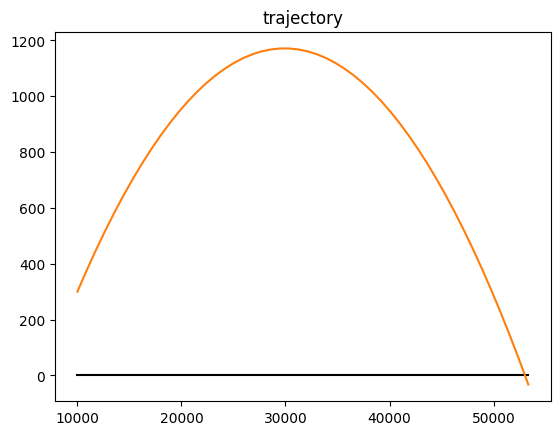

In [31]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

#------------------------------------------------------------------------------
# INPUT PARAMETERS
#------------------------------------------------------------------------------

dt = 30       # time interval 
x0 = 10000    # initial horizontal position
y0 = 300      # initial vertical position
v0 = 1500     # initial velocity
angle = 5     # angle of launch

#------------------------------------------------------------------------------

t = np.linspace(0, dt - 1)
x, y = BallisticTrajectory.position(v0, t, a=angle, x0=x0, y0=y0)

plt.title("trajectory")

# plot the ground
plt.plot(x, np.full(len(y), 0), color="black")

# plot the trajectory
plt.plot(x, y, color="C1")

Let's compare it with the velocity of the projectile.

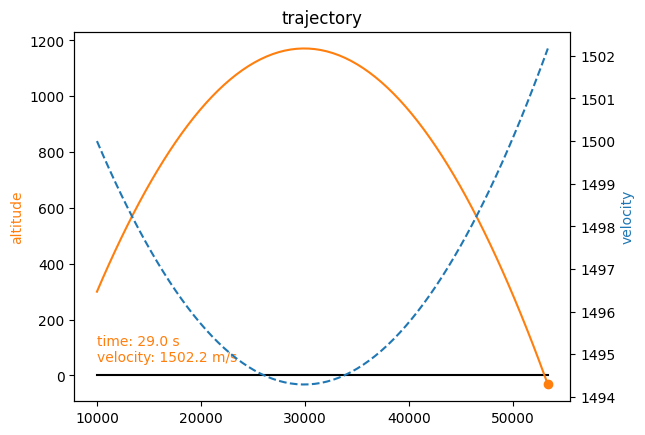

In [30]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

#------------------------------------------------------------------------------
# INPUT PARAMETERS
#------------------------------------------------------------------------------

fps = 5       # frame rate of genarted animation

dt = 30       # time interval 
x0 = 10000    # initial horizontal position
y0 = 300      # initial vertical position
v0 = 1500     # initial velocity
angle = 5     # angle of launch

#------------------------------------------------------------------------------

t = np.linspace(0, dt - 1, num=dt*fps)
x, y = BallisticTrajectory.position(v0, t, a=angle, x0=x0, y0=y0)
vx, vy, v = BallisticTrajectory.velocity(v0, t, a=angle)

plt.rcParams["animation.html"] = "jshtml"
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.set_title("trajectory")
ax1.set_ylabel("altitude", color="C1")
ax2.set_ylabel("velocity", color="C0")

# plot the ground
ax1.plot(x, np.full(len(y), 0), color="black")

# plot the trajectory
ax1.plot(x, y, color="C1")

# plot the velocity
ax2.plot(x, v, color="C0", linestyle="dashed")

# projectile animation

projectile, = ax1.plot(x0, y0, marker="o", color="C1")
text = ax1.text(x[0], 50, "", color="C1")

def update(t):
    px, py = BallisticTrajectory.position(v0, t, a = angle, x0=x0, y0=y0)
    _, _, v = BallisticTrajectory.velocity(v0, t, a=angle)
    projectile.set_data([px], [py])
    text.set_text(f"time: {round(t, 1)} s\nvelocity: {round(v, 1)} m/s")
    return projectile,

FuncAnimation(fig, update, frames=t, blit=True, interval=1000/fps)

As we can see, the velocity indeed is the lowest at the apogee of the ballistic trajectory and the highest on the ground level.

## Time on the Trajectory

We can find the time to reach a target using the projectile motion equation:

$$
  x = \upsilon_0t_x\ cos(\alpha) \Longrightarrow t_x = \frac{x}{\upsilon_0\ cos(\alpha)}
$$

where $x$ is the horizontal displacement of a target.

Second equation can be used to find the time to reach ground by the projectile:

$$
  y = h_0 + \upsilon_0 t_y\ sin(\alpha) - \frac{1}2g t_y^2 \Longrightarrow
  \frac{1}2g t_y^2 - \upsilon_0 t_y\ sin(\alpha) - h_0 - y = 0 \Longrightarrow
  t_y = \frac{\upsilon_0\ sin(\alpha) \pm \sqrt{(\upsilon_0\ sin(\alpha))^2 + 2g(h_0 - y)}}{g}
$$

This is the quadrtatic equation and it has two roots. But we are intersted in the solution with a greater time, thus:

$$
  t_y = \frac{\upsilon_0\ sin(\alpha) + \sqrt{(\upsilon_0\ sin(\alpha))^2 + 2g(h_0 - y)}}{g} = \frac{\upsilon_{0_y} + \sqrt{\upsilon_{0_y}^2 + 2g(h_0 - y)}}{g}
$$

$y$ here is the altitude of the ground.


## Properties of the Ballistic Trajectory

Using the ballistic trajectory equation we can also calculate different trajectory properties.

### Time on the Trajectory

A total time the object spends on the trajectory is the time between the moment of object launch ($t_0$) and the moment it meets the ground ($t_{impact}$). This time can be determined using the following formula:

$$
  t_{impact} = \frac{\upsilon_{0_y} + \sqrt{\upsilon_{0_y}^2 + 2gh}}{g} = \frac{\upsilon_0\ sin(\alpha) + \sqrt{(\upsilon_0\ sin(\alpha))^2 + 2gh}}{g}
$$

### Length of the Trajectory

A length of the object's trajectory ($d$) is the distance from the initial point of launch ($x_0$) to the _impact point_ ($x_{impact}$). If $x_0 = 0$, then:

$$
  d = x_{impact} = \upsilon_{0_x} t_{impact} = \upsilon_0 t_{impact} cos(\alpha)
$$

### Object Velocity on the Trajectory




In [ ]:
import math
import scipy.constants as spc

class BallisticTrajectory:
    
    """
    Class represents a ballistic trajectory.
    """
    
    def __init__(self, v, a = 0, h = 0):
        t = np.linspace(0, 30)
        self.x, self.y = BallisticTrajectory.pos(v, t, a, h)
        
    def plot(self, ground=None):
        
        if ground is not None:
            # plot the ground
            plt.plot(self.x, np.full(len(self.y), ground), color="C0")
        
        # plot the trajectory
        plt.plot(self.x, self.y, color="C3")
    
    @staticmethod
    def pos(v, t, a = 0, h = 0):

        """
        Calculates the position of the object along the ballistic 
        trajectory depending on launch parameters and time elapsed.

        Trajectory is a function of time and based on the ballistic 
        trajectory equation. It does not consider any external factor 
        excpet initial velocity of the object, initial altitude of 
        the object and constant gravitational acceleration.

        Parameters
        ----------

        v : float
            The velocity of the object (m/s).
        t : float
            The time elapsed since launch of the object (s).
        a : float (optional)
            The angle of launch of the object (in degrees) relative to the ground.
            Angle 0 (default value) means that the object was launched parallel 
            to the ground.
        h : float (optional)
            The altitude (in meters) at which the object was launched

        Returns
        -------

        x : float
            The horizontal position (in meters) of the object, relative to the launch point.
        y : float
            The vertical position (in meters) of the object, relative to the launch point.

        """

        rad = math.radians(a)
        vx = v * math.cos(rad)

        x = vx * t
        y = h + x * math.tan(rad) - 0.5 * spc.g * (x/vx)**2

        return x, y
    